In [1]:
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

from tensorflow.keras.applications import MobileNetV2,Xception,EfficientNetB7,InceptionResNetV2
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Input,LSTM, ConvLSTM2D, MaxPooling3D, TimeDistributed, Dense, Flatten, Dropout, Bidirectional, MaxPooling2D, InputLayer, BatchNormalization, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, Callback

from IPython.display import clear_output,Video

import os
import json
import cv2

#constants
IMG_SIZE = 128
FRAME_COUNT = 15

# 📚 Loading Data 📚

In [2]:
main_dir = '/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset'
classes = ['NonViolence','Violence']

# 📽 Displaying video from each category 📽

In [3]:
Normal = Video("/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_1.mp4", embed=True,width=400, height=400)
Violence = Video("/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_1.mp4", embed=True,width=400, height=400)
display(Normal)
display(Violence)

# 🖊️ Read Frames 🖊️

In [42]:
def load_video(path, nframes=FRAME_COUNT, size=(IMG_SIZE, IMG_SIZE)):
    frames = []
    cap = cv2.VideoCapture(path)

    
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT)) # Get the total number of frames in the video
    skip_frames = max(1, (total_frames // nframes) -1)  # Ensure at least 1 frame is skipped

    for _ in range(nframes):
        ret, frame = cap.read()  # Read the current frame
        if not ret:
            break

        # Process the current frame (resize, convert, normalize)
        frame = cv2.resize(frame, size)
        frame = frame[:, :, [2, 1, 0]]  # BGR to RGB
        frame = frame / 255.0
        frames.append(frame)

        # Skip the specified number of frames
        for _ in range(skip_frames):
            cap.grab()  # Advance to the next frame without reading it

    cap.release() 
    return frames


def extract_frames(main_directory):
    features = []
    labels = []
    for c in classes:
        class_dir = os.path.join(main_directory,c)
        for i,video in enumerate(os.listdir(class_dir)): 
            if i < 900:
                if video.endswith(('.mp4', '.avi', '.mov')): 
                    video_path = os.path.join(class_dir, video)

                    # Load and process the video
                    frames = load_video(video_path)

                    if len(frames) == FRAME_COUNT:
                        features.append(frames)
                        labels.append(c)
    return np.asarray(features),np.array(labels)

In [43]:
normal = load_video('/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/NonViolence/NV_1.mp4')
violence = load_video('/kaggle/input/real-life-violence-situations-dataset/Real Life Violence Dataset/Violence/V_1.mp4')

In [44]:
normal[0].shape,violence[0].shape

((1080, 1920, 3), (1080, 1920, 3))

***Original frame size 1080x1920 we will resize it to 128x128***

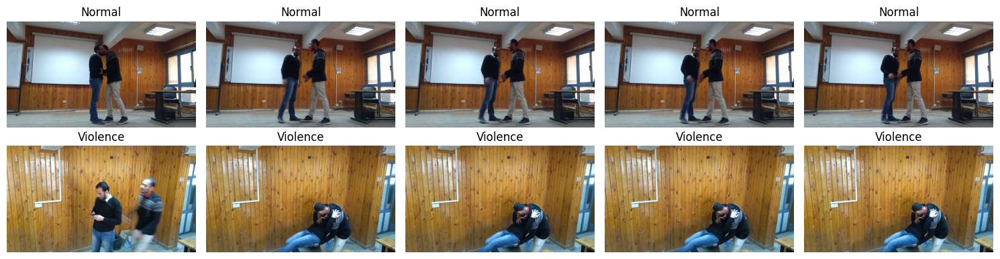

In [45]:
plt.figure(figsize=(15,4))

# Normal frames
for i in range(5):
    plt.subplot(2, 5, i + 1)
    plt.imshow(normal[-i])
    plt.title("Normal")
    plt.axis('off')

# Violence frames
for i in range(5):
    plt.subplot(2, 5, i + 6)
    plt.imshow(violence[-i])
    plt.title("Violence")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [9]:
X,y= extract_frames(main_dir)

[h264 @ 0x5669890ef7c0] mb_type 104 in P slice too large at 98 31
[h264 @ 0x5669890ef7c0] error while decoding MB 98 31


In [10]:
X.shape,y.shape

((1800, 15, 128, 128, 3), (1800,))

In [11]:
np.unique(y)

array(['NonViolence', 'Violence'], dtype='<U11')

# 🪓 Data Splitting 🪓

In [12]:
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,stratify=y)

In [13]:
X_train.shape,y_train.shape,X_test.shape,y_test.shape

((1440, 15, 128, 128, 3), (1440,), (360, 15, 128, 128, 3), (360,))

In [14]:
del X
del y

In [16]:
encoder = LabelEncoder()
y_train = encoder.fit_transform(y_train)
y_test = encoder.transform(y_test)

# ✨ Model ✨

In [35]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(128, 128, 3))

for layer in base_model.layers:
    layer.trainable = False


model = Sequential()
model.add(TimeDistributed(base_model, input_shape=(15, 128, 128, 3)))
model.add(TimeDistributed(GlobalAveragePooling2D())) 
model.add(TimeDistributed(Dropout(0.5)))
model.add(TimeDistributed(BatchNormalization()))

model.add(LSTM(256, return_sequences=True))
model.add(BatchNormalization())
model.add(Bidirectional(LSTM(128, return_sequences=True))) 
model.add(Bidirectional(LSTM(64, return_sequences=True))) 
model.add(Bidirectional(LSTM(32, return_sequences=False)))   

model.add(Dense(1024, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(512, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(256, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(128, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(64, activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.3))

model.add(Dense(1, activation='sigmoid'))  

model.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ time_distributed_20             │ ?                      │     2,257,984 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_21             │ ?                      │   0 (unbuilt) │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_22             │ ?                      │   0 (unbuilt) │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_23             │ ?                      │   0 (unbuilt) │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_18 (LSTM)                  │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_30          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_18                │ ?                      │   0 (unbuilt) │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_19                │ ?                      │   0 (unbuilt) │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_20                │ ?                      │   0 (unbuilt) │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_31          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_30 (Dropout)            │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_33          │ ?                      │   0 (unbuilt) │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [36]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = ModelCheckpoint(
    '/kaggle/working/bestt.keras',  
    monitor='val_loss',
    save_best_only=True,  
    mode='min',  
)
history = model.fit(
    x=X_train,
    y= y_train,
    validation_split=0.2,
    callbacks=[early_stopping,checkpoint],
    epochs= 30,
)

Epoch 1/30
36/36 ━━━━━━━━━━━━━━━━━━━━ 102s 1s/step - accuracy: 0.5835 - loss: 0.7408 - val_accuracy: 0.8750 - val_loss: 0.6135
Epoch 2/30
36/36 ━━━━━━━━━━━━━━━━━━━━ 14s 383ms/step - accuracy: 0.8891 - loss: 0.2715 - val_accuracy: 0.9132 - val_loss: 0.4838
Epoch 3/30
36/36 ━━━━━━━━━━━━━━━━━━━━ 14s 389ms/step - accuracy: 0.9510 - loss: 0.1512 - val_accuracy: 0.9444 - val_loss: 0.3824
Epoch 4/30
36/36 ━━━━━━━━━━━━━━━━━━━━ 14s 390ms/step - accuracy: 0.9540 - loss: 0.1270 - val_accuracy: 0.9097 - val_loss: 0.3480
Epoch 5/30
36/36 ━━━━━━━━━━━━━━━━━━━━ 14s 389ms/step - accuracy: 0.9628 - loss: 0.1024 - val_accuracy: 0.9549 - val_loss: 0.2803
Epoch 6/30
36/36 ━━━━━━━━━━━━━━━━━━━━ 14s 384ms/step - accuracy: 0.9840 - loss: 0.0611 - val_accuracy: 0.9653 - val_loss: 0.2189
Epoch 7/30
36/36 ━━━━━━━━━━━━━━━━━━━━ 14s 384ms/step - accuracy: 0.9702 - loss: 0.0679 - val_accuracy: 0.9514 - val_loss: 0.2031
Epoch 8/30
36/36 ━━━━━━━━━━━━━━━━━━━━ 13s 363ms/step - accuracy: 0.9731 - loss: 0.0766 - val_accura

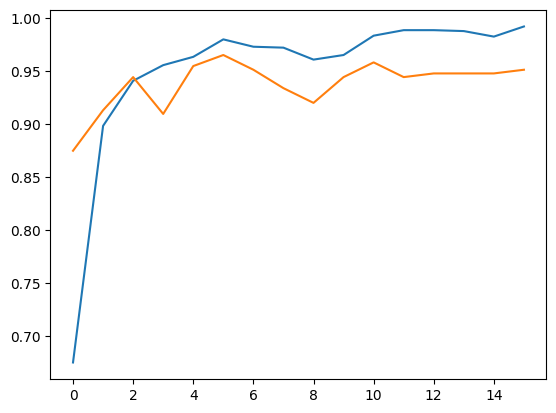

In [37]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

In [38]:
model.evaluate(X_test,y_test)

12/12 ━━━━━━━━━━━━━━━━━━━━ 20s 261ms/step - accuracy: 0.9328 - loss: 0.2129


[0.1723475605249405, 0.9472222328186035]

12/12 ━━━━━━━━━━━━━━━━━━━━ 35s 2s/step 
              precision    recall  f1-score   support

           0       0.98      0.91      0.95       180
           1       0.92      0.98      0.95       180

    accuracy                           0.95       360
   macro avg       0.95      0.95      0.95       360
weighted avg       0.95      0.95      0.95       360



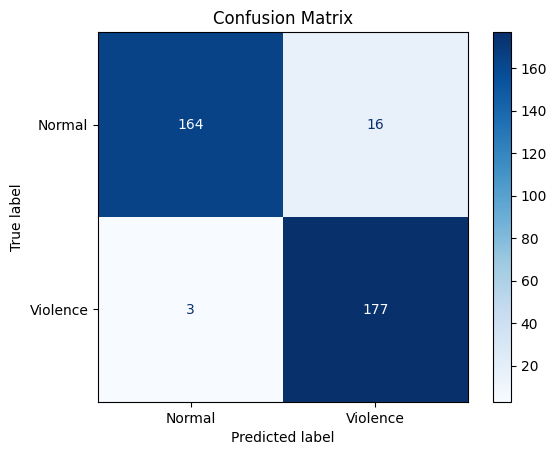

In [39]:
import numpy as np
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import matplotlib.pyplot as plt


y_pred_probs = model.predict(X_test)
y_pred = (y_pred_probs > 0.5).astype(int)

print(classification_report(y_test, y_pred))

cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Normal', 'Violence'])
disp.plot(cmap="Blues")
plt.title("Confusion Matrix")
plt.show()

***Thanks 🥂***